Define the path to the training and test sets and the annotations file

In [1]:
! python --version

Python 3.11.8


In [2]:
from pathlib import Path

In [3]:
data = Path.home().joinpath('projects/Handwritten-Document-Conversion/data')
train_data = data.joinpath('train')
test_data = data.joinpath('test')

In [4]:
train_annotations = data.joinpath('train/train.manifest')
test_annotations = data.joinpath('test/test.manifest')

Explore the annotations file.

In [5]:
import json

with open(train_annotations, 'r') as file:
    train_manifest = file.readlines()
    
with open(test_annotations, 'r') as file:
    test_manifest = file.readlines()

metadata = {
    'train': [ json.loads(line) for line in train_manifest ],
    'test': [ json.loads(line) for line in test_manifest ]
}

In [6]:
example = metadata['train'][0]
if isinstance(example, dict):
    keys = list(example.keys())
keys

['source-ref', 'annotations']

In [7]:
example

{'source-ref': 'eng_EU_242.jpg',
 'annotations': {'texts': [{'text': 'Liam',
    'polygon': [{'x': 1069, 'y': 95},
     {'x': 1337, 'y': 162},
     {'x': 1046, 'y': 263},
     {'x': 1399, 'y': 269}]},
   {'text': 'is',
    'polygon': [{'x': 1438, 'y': 162},
     {'x': 1528, 'y': 140},
     {'x': 1460, 'y': 274},
     {'x': 1595, 'y': 274}]},
   {'text': 'mixing',
    'polygon': [{'x': 1690, 'y': 157},
     {'x': 2137, 'y': 140},
     {'x': 1712, 'y': 269},
     {'x': 2115, 'y': 369}]},
   {'text': 'flour,',
    'polygon': [{'x': 2249, 'y': 101},
     {'x': 2615, 'y': 186},
     {'x': 2193, 'y': 280},
     {'x': 2541, 'y': 303}]},
   {'text': 'Butter',
    'polygon': [{'x': 2647, 'y': 123},
     {'x': 2971, 'y': 185},
     {'x': 2630, 'y': 252},
     {'x': 2910, 'y': 263}]},
   {'text': ',and',
    'polygon': [{'x': 2982, 'y': 207},
     {'x': 3139, 'y': 146},
     {'x': 2943, 'y': 291},
     {'x': 3178, 'y': 302}]},
   {'text': 'Cheese',
    'polygon': [{'x': 1192, 'y': 403},
     {'x'

In [8]:
image = example['source-ref']
image

'eng_EU_242.jpg'

In [9]:
annotations = example['annotations']

In [10]:
type(annotations)

dict

In [11]:
annotations.keys()

dict_keys(['texts'])

In [12]:
type(annotations['texts'])

list

In [13]:
annotations['texts'][0]

{'text': 'Liam',
 'polygon': [{'x': 1069, 'y': 95},
  {'x': 1337, 'y': 162},
  {'x': 1046, 'y': 263},
  {'x': 1399, 'y': 269}]}

Looking @ the output of `x['texts'][0]['text]` and `x['texts'][0]['polygon']`, each token is bounded by a box.
Each polygon/box is defined by four vertices. We will only keep two vertices, the top-left and
the bottom-right i.e x_min, y_min and x_max, y_max

In [14]:
from PIL import Image, JpegImagePlugin as JpgPlugin

(4000, 3000)


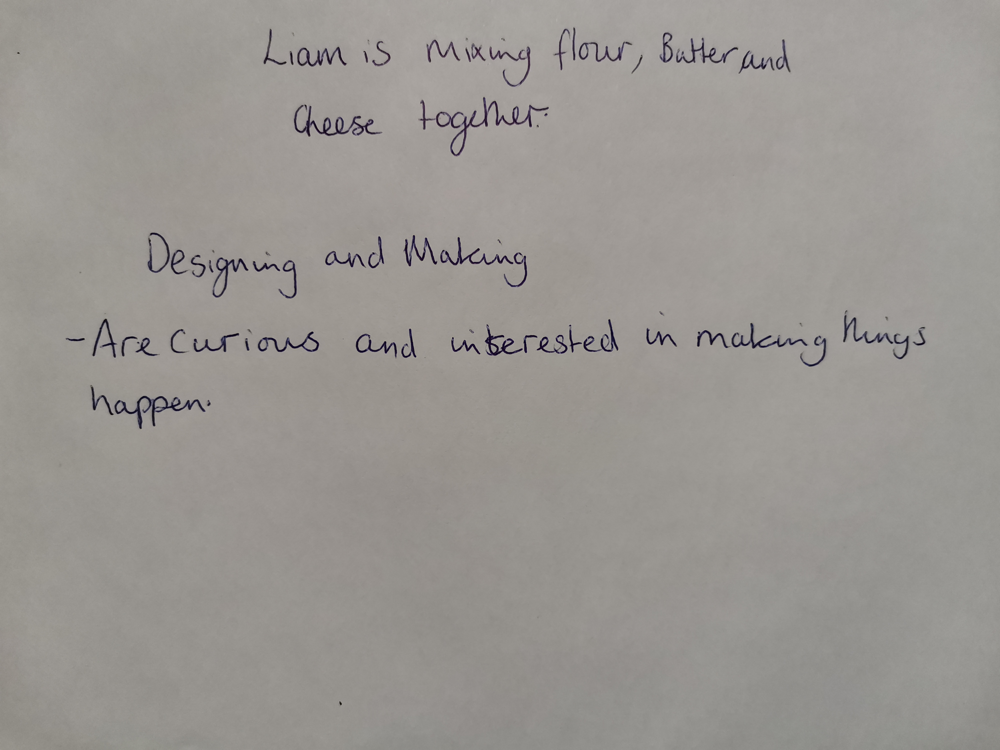

In [15]:
temp = metadata['train']
file = temp[0]['source-ref']
image = Image.open(train_data.joinpath(file))
print(image.size)
image

In [16]:
from transformers import pipeline

ner_pipeline = pipeline("ner", model="bert-base-uncased")

Some weights of BertForTokenClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


In [17]:
def extract_tokens(text):
    return [ word['text'] for word in text ]

def define_labels(text):
    labels = []
    for word in text:
        ner_prediction = ner_pipeline(word['text'])
        label = ner_prediction[0]['entity'].split("_")[-1] if ner_prediction else '-1'
        labels.append(label)
    labels = [ int(item) for item in labels]
    return labels


def extract_bboxes(text, image_size):
    width, height = image_size
    target_width, target_height = 762, 1000
    x_scalar = target_width / width
    y_scalar = target_height / height
    #print(width, height)
    
    bboxes = []
    for word in text:
        polygon = word['polygon']
        x = [point["x"] for point in polygon]
        y = [point["y"] for point in polygon]
        
        # Calculate the boundaries
        x_min = min(x)
        y_min = min(y)
        x_max = max(x)
        y_max = max(y)
        # Normalize the boundaries
        normalized_boundary = [
            min(int(x_min * x_scalar), target_width - 1),
            min(int(y_min * y_scalar), target_height - 1),
            min(int(x_max * x_scalar), target_width - 1),
            min(int(y_max * y_scalar), target_height - 1)
        ]
        bboxes.append(normalized_boundary)
    return bboxes
    
def resize_image(image, target_size=(762, 1000)):
    resized_image = image.resize(target_size, Image.LANCZOS) 
    return resized_image


def prep_features(metadata, data_dir):
    image_paths = [ example['source-ref'] for example in metadata ]
    annotations = [ example['annotations'] for example in metadata ]
    images = ( Image.open(data_dir.joinpath(file)) for file in image_paths )

    # Convert the images into 'RGB' format and resize to (762, 1000) for LayoutLMv3
    images = [ image if image.mode == 'RGB' else image.convert('RGB') for image in images ]
    resized_images = list(map(resize_image, images))
    tokens = list(map(extract_tokens, (item['texts'] for item in annotations)))
    ner_tags = list(map(define_labels, (item['texts'] for item in annotations)))
    bboxes = list(map(extract_bboxes, (item['texts'] for item in annotations),
                     (image.size for image in images))) 

    return image_paths, tokens, ner_tags, bboxes, resized_images

In [18]:
train_ids, train_tokens, train_ner_tags, train_bboxes, train_images = prep_features(metadata['train'], train_data)

Let's do the same for the test set and finalize the dset.

In [19]:
test_ids, test_tokens, test_ner_tags, test_bboxes, test_images = prep_features(metadata['test'], test_data)

Let's now verify the normalization.

In [20]:
print(len(test_ner_tags[0]))
print(len(test_tokens[0]))
print(len(test_bboxes[0]))

27
27
27


In [21]:
str(1)

'1'

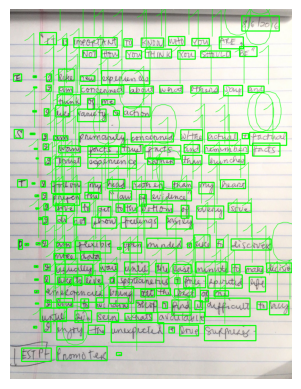

In [22]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

image_array = np.array(train_images[2])

# Assume train_labels[2] contains the labels corresponding to each bounding box in train_bboxes[2]
for i, boundary in enumerate(train_bboxes[2]):
    x_min, y_min, x_max, y_max = boundary
    
    # Draw the bounding box
    image_array = cv2.rectangle(image_array, (x_min, y_min), (x_max, y_max), color=(0, 255, 0), thickness=2)
    
    # Put the label text above the bounding box
    label = train_ner_tags[2][i]
    label = str(label)
    font_scale = 5
    font_thickness = 1
    image_array = cv2.putText(image_array, label, (x_min, y_min - 5), cv2.FONT_HERSHEY_SIMPLEX, 
                              font_scale, (0, 255, 0), font_thickness, cv2.LINE_AA)

# Display the image with bounding boxes and labels
plt.imshow(image_array)
plt.axis('off')
plt.show()

In [23]:
from datasets import Dataset, DatasetDict

In [24]:
train = Dataset.from_dict({'id': train_ids, 'tokens': train_tokens, 'ner_tags': train_ner_tags, 'bboxes': train_bboxes, 'image': train_images})
test = Dataset.from_dict({'id': test_ids, 'tokens': test_tokens, 'ner_tags': test_ner_tags, 'bboxes': test_bboxes, 'image': test_images})

In [25]:
train, test

(Dataset({
     features: ['id', 'tokens', 'ner_tags', 'bboxes', 'image'],
     num_rows: 515
 }),
 Dataset({
     features: ['id', 'tokens', 'ner_tags', 'bboxes', 'image'],
     num_rows: 172
 }))

In [26]:
dset =  DatasetDict({ 'train': train, 'test': test })
dset.shape

{'train': (515, 5), 'test': (172, 5)}

In [27]:
example = dset['train'][0]
x = example['ner_tags']
x

[1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]

In [28]:
for i in range((len(dset['train']))):
    image = dset['train'][i]['image']
    if image.mode != 'RGB':
        print(image.mode)

In [29]:
example = dset['test'][100]
print(example.keys())
len(example['tokens']) == len(example['bboxes']) == len(example['ner_tags'])

dict_keys(['id', 'tokens', 'ner_tags', 'bboxes', 'image'])


True

### Save the dset locally

In [30]:
dset.save_to_disk("./mydset")

Saving the dataset (0/1 shards):   0%|          | 0/515 [00:00<?, ? examples/s]

Saving the dataset (0/1 shards):   0%|          | 0/172 [00:00<?, ? examples/s]

### Upload the dset to huggingface.

In [31]:
! pip freeze | grep hug

huggingface_hub @ file:///croot/huggingface_hub_1716498284908/work


In [33]:
dset.push_to_hub("nikinbaidar/handwritten")

Uploading the dataset shards:   0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/515 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/6 [00:00<?, ?ba/s]

Uploading the dataset shards:   0%|          | 0/1 [00:00<?, ?it/s]

Map:   0%|          | 0/172 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/2 [00:00<?, ?ba/s]

README.md:   0%|          | 0.00/546 [00:00<?, ?B/s]

CommitInfo(commit_url='https://huggingface.co/datasets/nikinbaidar/handwritten/commit/9aaa219108b0d0631e5649a744ab3fb7cce9bab0', commit_message='Upload dataset', commit_description='', oid='9aaa219108b0d0631e5649a744ab3fb7cce9bab0', pr_url=None, pr_revision=None, pr_num=None)